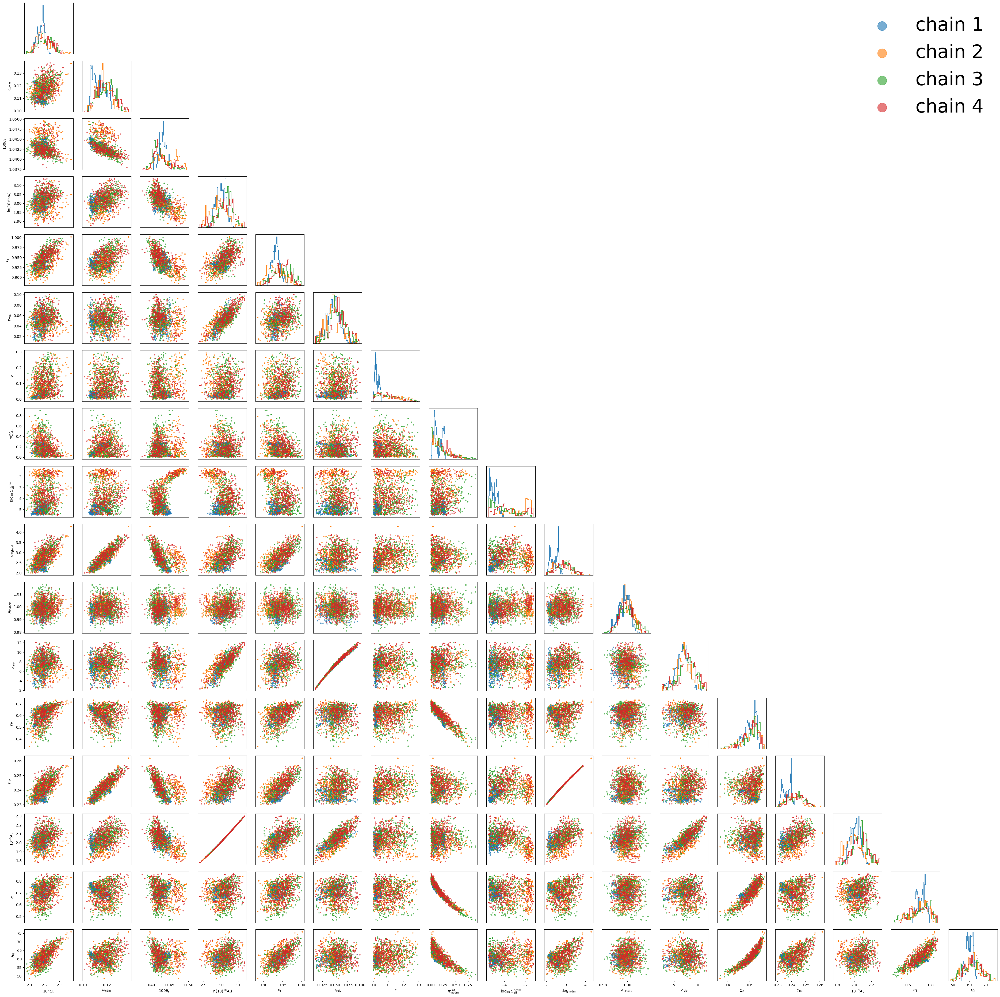

In [5]:
import numpy as np
import glob
import matplotlib.pyplot as plt
from itertools import combinations

# ------------------------------------------------------------------
# Paths
# ------------------------------------------------------------------
chain_dir = "/home/jeppethybo/connect_public/Grendel_files/SIDR_iter_number_6/full_chains"
chain_files = sorted(glob.glob(f"{chain_dir}/*.txt"))

n_chains = len(chain_files)
if n_chains == 0:
    raise RuntimeError("No chain files found")

# ------------------------------------------------------------------
# Parameters (ORDER MATTERS)
# ------------------------------------------------------------------
param_names = [
    "omega_b",
    "omega_cdm",
    "theta_s_100",
    "ln10A_s",
    "n_s",
    "tau_reio",
    "r",
    "m_ncdm_interacting",
    "log10G_eff_ncdm_interacting",
    "deg_ncdm_interacting",
    "A_planck",
    "z_reio",
    "Omega_Lambda",
    "YHe",
    "A_s",
    "sigma8",
    "H0",
]

param_labels = [
    r"$10^{2}\omega_b$",
    r"$\omega_{\rm cdm}$",
    r"$100\theta_s$",
    r"$\ln(10)^{10}A_s)$",
    r"$n_s$",
    r"$\tau_{\rm reio}$",
    r"$r$",
    r"$m_{\rm ncdm}^{\rm int}$",
    r"$\log_{10} G_{\rm eff}^{\rm ncdm}$",
    r"${\rm deg}_{\rm ncdm}$",
    r"$A_{\rm Planck}$",
    r"$z_{\rm reio}$",
    r"$\Omega_\Lambda$",
    r"$Y_{\rm He}$",
    r"$10^{-9}A_s$",
    r"$\sigma_8$",
    r"$H_0$",
]

n_params = len(param_names)

# ------------------------------------------------------------------
# Load chains separately
# ------------------------------------------------------------------
chains = []

for f in chain_files:
    data = np.loadtxt(f)
    params = data[:, 2:2 + n_params]  # drop step + -loglike
    chains.append(params)

# ------------------------------------------------------------------
# Plot settings
# ------------------------------------------------------------------
colors = plt.cm.tab10.colors  # distinct chain colors
alpha = 0.6
s = 6  # marker size

fig, axes = plt.subplots(
    n_params, n_params,
    figsize=(2.2 * n_params, 2.2 * n_params),
    squeeze=False
)

# ------------------------------------------------------------------
# Triangle plotting
# ------------------------------------------------------------------
for i in range(n_params):
    for j in range(n_params):

        ax = axes[i, j]

        # Upper triangle: empty
        if j > i:
            ax.axis("off")
            continue

        # Diagonal: 1D histograms
        if i == j:
            for c, chain in enumerate(chains):
                ax.hist(
                    chain[:, i],
                    bins=30,
                    histtype="step",
                    color=colors[c % len(colors)],
                    linewidth=1.2,
                    density=True,
                )
        # Lower triangle: 2D scatter
        else:
            for c, chain in enumerate(chains):
                ax.scatter(
                    chain[:, j],
                    chain[:, i],
                    s=s,
                    alpha=alpha,
                    color=colors[c % len(colors)],
                    label=f"chain {c+1}" if (i == n_params - 1 and j == 0) else None,
                )

        # Labels
        if i == n_params - 1:
            ax.set_xlabel(param_labels[j], fontsize=10)
        else:
            ax.set_xticks([])

        if j == 0 and i != 0:
            ax.set_ylabel(param_labels[i], fontsize=10)
        else:
            ax.set_yticks([])

# ------------------------------------------------------------------
# Legend (only once)
# ------------------------------------------------------------------
handles, labels = axes[-1, 0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="upper right",
    fontsize=50,
    frameon=False,
    markerscale=10
)

plt.tight_layout()
plt.show()


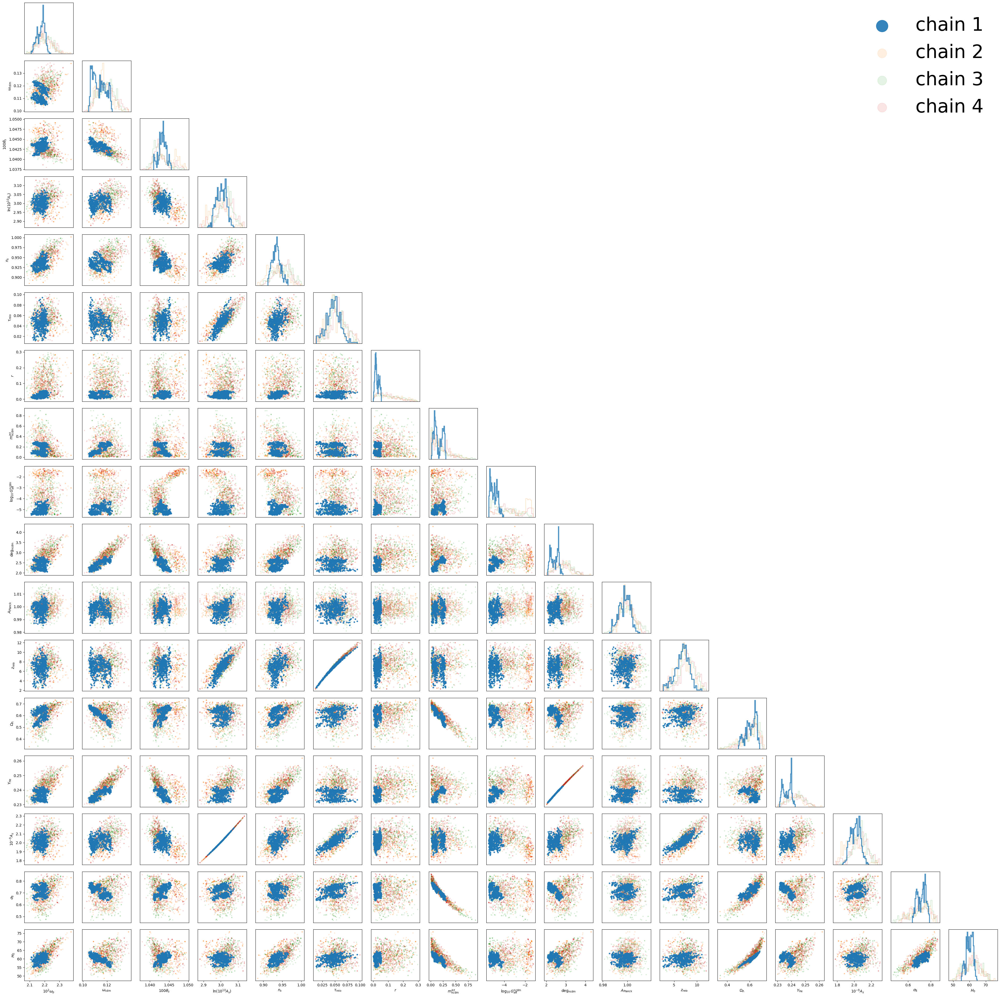

In [7]:
import numpy as np
import glob
import matplotlib.pyplot as plt

# ------------------------------------------------------------------
# Paths
# ------------------------------------------------------------------
chain_dir = "/home/jeppethybo/connect_public/Grendel_files/SIDR_iter_number_6/full_chains"
chain_files = sorted(glob.glob(f"{chain_dir}/*.txt"))

n_chains = len(chain_files)
if n_chains == 0:
    raise RuntimeError("No chain files found")

# ------------------------------------------------------------------
# Parameters (ORDER MATTERS)
# ------------------------------------------------------------------
param_names = [
    "omega_b",
    "omega_cdm",
    "theta_s_100",
    "ln10A_s",
    "n_s",
    "tau_reio",
    "r",
    "m_ncdm_interacting",
    "log10G_eff_ncdm_interacting",
    "deg_ncdm_interacting",
    "A_planck",
    "z_reio",
    "Omega_Lambda",
    "YHe",
    "A_s",
    "sigma8",
    "H0",
]

param_labels = [
    r"$10^{2}\omega_b$",
    r"$\omega_{\rm cdm}$",
    r"$100\theta_s$",
    r"$\ln(10^{10}A_s)$",
    r"$n_s$",
    r"$\tau_{\rm reio}$",
    r"$r$",
    r"$m_{\rm ncdm}^{\rm int}$",
    r"$\log_{10} G_{\rm eff}^{\rm ncdm}$",
    r"${\rm deg}_{\rm ncdm}$",
    r"$A_{\rm Planck}$",
    r"$z_{\rm reio}$",
    r"$\Omega_\Lambda$",
    r"$Y_{\rm He}$",
    r"$10^{-9}A_s$",
    r"$\sigma_8$",
    r"$H_0$",
]

n_params = len(param_names)

# ------------------------------------------------------------------
# Load chains separately
# ------------------------------------------------------------------
chains = []

for f in chain_files:
    data = np.loadtxt(f)
    params = data[:, 2:2 + n_params]  # drop step + -loglike
    chains.append(params)

# ------------------------------------------------------------------
# Plot settings
# ------------------------------------------------------------------
colors = plt.cm.tab10.colors

fig, axes = plt.subplots(
    n_params, n_params,
    figsize=(2.2 * n_params, 2.2 * n_params),
    squeeze=False
)

# ------------------------------------------------------------------
# Triangle plotting
# ------------------------------------------------------------------
for i in range(n_params):
    for j in range(n_params):

        ax = axes[i, j]

        # Upper triangle: empty
        if j > i:
            ax.axis("off")
            continue

        # Diagonal: 1D histograms
        if i == j:
            for c, chain in enumerate(chains):

                if c == 0:  # highlight chain 1
                    alpha = 0.8
                    lw = 2.5
                    zorder = 3
                else:
                    alpha = 0.25
                    lw = 1.2
                    zorder = 1

                ax.hist(
                    chain[:, i],
                    bins=30,
                    histtype="step",
                    color=colors[c % len(colors)],
                    linewidth=lw,
                    density=True,
                    alpha=alpha,
                    zorder=zorder,
                )

        # Lower triangle: 2D scatter
        else:
            for c, chain in enumerate(chains):

                if c == 0:  # highlight chain 1
                    alpha = 0.9
                    size = 10
                    zorder = 3
                else:
                    alpha = 0.12
                    size = 6
                    zorder = 1

                ax.scatter(
                    chain[:, j],
                    chain[:, i],
                    s=size,
                    alpha=alpha,
                    color=colors[c % len(colors)],
                    zorder=zorder,
                    label=f"chain {c+1}" if (i == n_params - 1 and j == 0) else None,
                )

        # Labels
        if i == n_params - 1:
            ax.set_xlabel(param_labels[j], fontsize=10)
        else:
            ax.set_xticks([])

        if j == 0 and i != 0:
            ax.set_ylabel(param_labels[i], fontsize=10)
        else:
            ax.set_yticks([])

# ------------------------------------------------------------------
# Legend (only once)
# ------------------------------------------------------------------
handles, labels = axes[-1, 0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="upper right",
    fontsize=50,
    frameon=False,
    markerscale=10,
)

plt.tight_layout()
plt.show()
